In [1]:
import os
import numpy as np
import math
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow import keras
import matplotlib.pyplot as plt

In [2]:
IMG_SHAPE = (28,28,1)
BATCH_SIZE = 128
EPOCHS = 200
T = 200
beta_start = 1e-4
beta_end = 0.02
LR = 2e-4

In [3]:
# Load MNIST scaled to [-1,1]
(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
x = np.concatenate([x_train, x_test], axis=0).astype(np.float32)
x = x[..., None] / 127.5 - 1.0
dataset = tf.data.Dataset.from_tensor_slices(x).shuffle(10000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


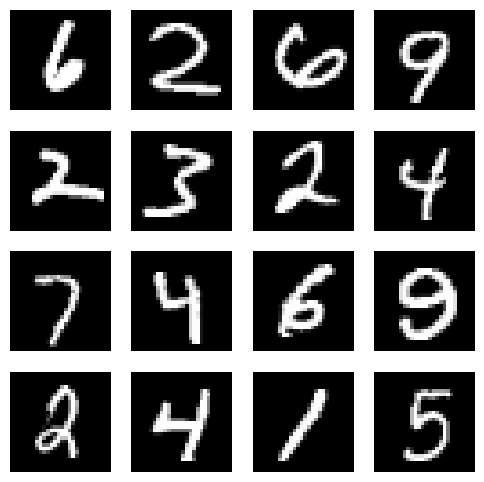

In [4]:
# Function to plot images
def plot_images(images, num_rows=4, num_cols=4):
    images = (images + 1.0) / 2.0  # scale back to [0,1] for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(6,6))
    idx = 0
    for i in range(num_rows):
        for j in range(num_cols):
            axes[i, j].imshow(images[idx].squeeze(), cmap="gray")
            axes[i, j].axis("off")
            idx += 1
    plt.show()

# Get one batch from dataset and plot
sample_batch = next(iter(dataset))
plot_images(sample_batch.numpy()[:16], num_rows=4, num_cols=4)

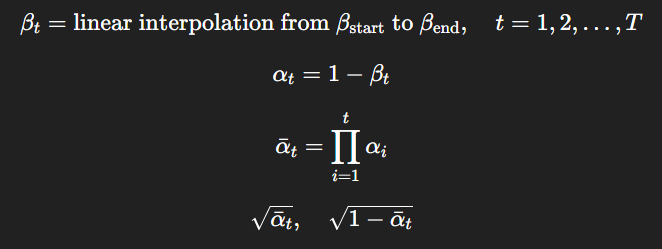

In [5]:
# Beta schedule (linear)
betas = np.linspace(beta_start, beta_end, T, dtype=np.float32)
alphas = 1.0 - betas
alpha_cumprod = np.cumprod(alphas, axis=0).astype(np.float32)  # \bar{alpha}_t
sqrt_alpha_cumprod = np.sqrt(alpha_cumprod)
sqrt_one_minus_alpha_cumprod = np.sqrt(1.0 - alpha_cumprod)

In [6]:

# Fixed sinusoidal embedding
def sinusoidal_time_embedding(timesteps, dim=128):
    # timesteps: (batch,) int32
    timesteps = tf.cast(timesteps, tf.float32)  # ensure float
    half = dim // 2
    freqs = tf.exp(-math.log(10000.0) * tf.range(0, half, dtype=tf.float32) / float(half))
    args = tf.expand_dims(timesteps, -1) * tf.expand_dims(freqs, 0)  # (batch, half)
    emb = tf.concat([tf.sin(args), tf.cos(args)], axis=-1)  # (batch, dim)
    if dim % 2 == 1:
        emb = tf.pad(emb, [[0,0],[0,1]])
    return emb

In [7]:
class TimeEmbedding(layers.Layer):
    def __init__(self, dim):
        super().__init__()
        self.d1 = layers.Dense(dim, activation="swish")
        self.d2 = layers.Dense(dim, activation="swish")
        self.dim = dim
    def call(self, t):
        emb = sinusoidal_time_embedding(t, self.dim)
        return self.d2(self.d1(emb))

In [8]:
# Residual Block with time embedding
def ResidualBlock(x, t_emb, filters, name):
    # Project time embedding to channel dimension
    t_proj = layers.Dense(filters, activation='swish')(t_emb)
    t_proj = layers.Reshape((1, 1, filters))(t_proj)

    h = layers.Conv2D(filters, 3, padding='same')(x)
    h = layers.GroupNormalization()(h)
    h = layers.Activation('swish')(h)

    # Inject time embedding
    h = layers.Add()([h, t_proj])

    h = layers.Conv2D(filters, 3, padding='same')(h)
    h = layers.GroupNormalization()(h)

    # Residual connection
    if x.shape[-1] != filters:
        x = layers.Conv2D(filters, 1, padding='same')(x)

    out = layers.Add()([x, h])
    out = layers.Activation('swish', name=f"{name}_out")(out)
    return out


def build_epsilon_model(img_shape=(28,28,1), time_emb_dim=128):
    inp = layers.Input(img_shape, name='x_t')
    t_in = layers.Input(shape=(), dtype=tf.int32, name='t')

    # TimeEmbedding
    t_emb = TimeEmbedding(time_emb_dim)(t_in)

    # Encoder
    x1 = ResidualBlock(inp, t_emb, 64, name="enc1")        # 28x28
    x = layers.Conv2D(64, 3, strides=2, padding='same')(x1)

    x2 = ResidualBlock(x, t_emb, 128, name="enc2")         # 14x14
    x = layers.Conv2D(128, 3, strides=2, padding='same')(x2)

    x3 = ResidualBlock(x, t_emb, 256, name="enc3")         # 7x7

    # Bottleneck
    x = ResidualBlock(x3, t_emb, 512, name="bottleneck")

    # Decoder
    x = layers.Conv2DTranspose(256, 3, strides=2, padding='same')(x)  # 14x14
    x = layers.Concatenate()([x, x2])
    x = ResidualBlock(x, t_emb, 256, name="dec1")

    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)  # 28x28
    x = layers.Concatenate()([x, x1])
    x = ResidualBlock(x, t_emb, 128, name="dec2")

    # Output
    out = layers.Conv2D(1, 3, padding='same', name='out')(x)

    return Model([inp, t_in], out, name='epsilon_model_complex')


In [9]:
# Build epsilon model
epsilon_model = build_epsilon_model(img_shape=(28, 28, 1), time_emb_dim=128)

# Define optimizer
optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.9, beta_2=0.999, epsilon=1e-7)


In [10]:
# Compile model
epsilon_model.compile(
    optimizer=optimizer,
    loss=keras.losses.MeanSquaredError(),
    metrics=[keras.metrics.MeanAbsoluteError()]
)

In [11]:
epsilon_model.summary()

Model: "epsilon_model_complex"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ x_t (InputLayer)    │ (None, 28, 28, 1) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ t (InputLayer)      │ (None)            │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 28, 28,    │        640 │ x_t[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_embedding      │ (None, 128)       │     33,024 │ t[0][0]           │
│ (TimeEmbedding)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalization │ (None, 28, 28,    │        128 │ conv2d[0][0]      │
│ (GroupNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      8,256 │ time_embedding[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 28, 28,    │          0 │ group_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 64)  │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 28, 28,    │          0 │ activation[0][0], │
│                     │ 64)               │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 28, 28,    │     36,928 │ add[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 28, 28,    │        128 │ x_t[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 28, 28,    │        128 │ conv2d_1[0][0]    │
│ (GroupNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 28, 28,    │          0 │ conv2d_2[0][0],   │
│                     │ 64)               │            │ group_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc1_out            │ (None, 28, 28,    │          0 │ add_1[0][0]       │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 14, 14,    │     36,928 │ enc1_out[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 14, 14,    │     73,856 │ conv2d_3[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 14, 14,    │        256 │ conv2d_4[0][0]    │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │     16,512 │ time_embedding[0… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 8,696,897 (33.18 MB)

 Trainable params: 8,696,897 (33.18 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
from tensorflow.keras.utils import plot_model
plot_model(epsilon_model, show_shapes=True)

In [13]:
# Training step
@tf.function
def train_step(x0):
    batch_size = tf.shape(x0)[0]
    t = tf.random.uniform((batch_size,), minval=0, maxval=T, dtype=tf.int32)
    alpha_bar = tf.gather(tf.constant(sqrt_alpha_cumprod, dtype=tf.float32), t)  # sqrt(alpha_cumprod)
    one_minus_alpha_bar = tf.gather(tf.constant(sqrt_one_minus_alpha_cumprod, dtype=tf.float32), t)
    alpha_bar = tf.reshape(alpha_bar, (-1,1,1,1))
    one_minus_alpha_bar = tf.reshape(one_minus_alpha_bar, (-1,1,1,1))

    eps = tf.random.normal(tf.shape(x0))
    x_t = alpha_bar * x0 + one_minus_alpha_bar * eps
    with tf.GradientTape() as tape:
        eps_pred = epsilon_model([x_t, t], training=True)
        loss = tf.reduce_mean(tf.square(eps - eps_pred))
    grads = tape.gradient(loss, epsilon_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, epsilon_model.trainable_variables))
    return loss

In [14]:
# Sampling (Algorithm 2) using learned eps predictor
def sample(n_samples=16):
    x_t = tf.random.normal((n_samples,)+IMG_SHAPE)
    for t_i in reversed(range(T)):
        t_batch = tf.fill((n_samples,), tf.cast(t_i, tf.int32))
        eps_pred = epsilon_model([x_t, t_batch], training=False)
        beta_i = float(betas[t_i])
        alpha_i = float(alphas[t_i])
        alpha_bar_i = float(alpha_cumprod[t_i])
        coef = beta_i / math.sqrt(1.0 - alpha_bar_i)
        if t_i > 0:
            z = tf.random.normal(tf.shape(x_t))
        else:
            z = tf.zeros_like(x_t)
        sigma_t = math.sqrt(beta_i)  # choose sigma_t = sqrt(beta_t)
        x_t = (1.0 / math.sqrt(alpha_i)) * (x_t - coef * eps_pred) + sigma_t * z
    return x_t

In [15]:
# Function to save generated images at each epoch
def save_generated_images(model, epoch, sample_fn, out_dir="/content", num_samples=16):
    os.makedirs(out_dir, exist_ok=True)

    images = sample_fn(num_samples).numpy()
    images = (images + 1.0) * 127.5
    images = np.clip(images, 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(4, 4, figsize=(6, 6))
    idx = 0
    for i in range(4):
        for j in range(4):
            axes[i, j].imshow(images[idx].squeeze(), cmap="gray")
            axes[i, j].axis("off")
            idx += 1

    plt.suptitle(f"Generated - Epoch {epoch+1}")
    file_path = ('image_at_epoch_{:04d}.png'.format(epoch))
    plt.savefig(file_path)
    plt.close()
    print(f"[INFO] Saved generated images at {file_path}")

In [16]:
# Training function
def train_model(dataset, epochs, batch_size, train_step, sample_fn):
    steps_per_epoch = int(np.ceil(len(dataset) / batch_size))

    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        prog = tf.keras.utils.Progbar(steps_per_epoch)

        # iterate over dataset
        for step, batch in enumerate(dataset.take(steps_per_epoch)):
            loss = train_step(batch)
            prog.update(step + 1, [("loss", loss.numpy())])

        # Save generated images after each epoch
        save_generated_images(None, epoch, sample_fn)

In [17]:
train_model(dataset, EPOCHS, BATCH_SIZE, train_step, sample)


Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 20s 242ms/step - loss: 1.7236
[INFO] Saved generated images at image_at_epoch_0000.png

Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.5648
[INFO] Saved generated images at image_at_epoch_0001.png

Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - loss: 0.4317
[INFO] Saved generated images at image_at_epoch_0002.png

Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.3508
[INFO] Saved generated images at image_at_epoch_0003.png

Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.3265
[INFO] Saved generated images at image_at_epoch_0004.png

Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step - loss: 0.2951
[INFO] Saved generated images at image_at_epoch_0005.png

Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 272ms/step - loss: 0.2698
[INFO] Saved generated images at image_at_epoch_0006.png

Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.2599
[INFO] Saved generated images at image_at_epoch_0007.png

Epoch 

In [18]:
import glob
import imageio
import os
import PIL
from IPython import display

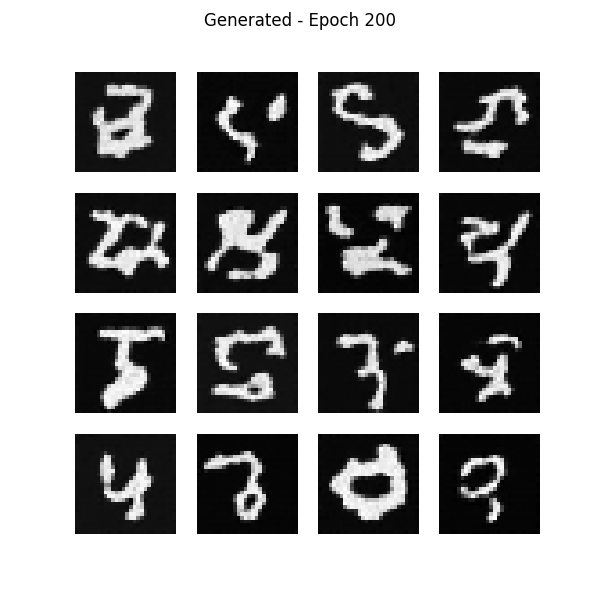

In [25]:
PIL.Image.open('/content/image_at_epoch_0199.png')

In [19]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

In [20]:
anim_file = 'diffusion_model.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

/tmp/ipython-input-2580269548.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipython-input-2580269548.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



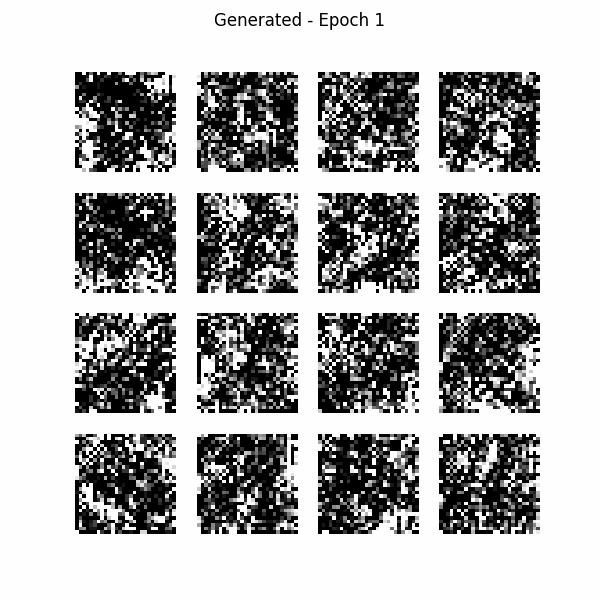

In [22]:
import tensorflow_docs.vis.embed as embed
from IPython.display import display
anim_file = '/content/diffusion_model.gif'

display(embed.embed_file(anim_file))